# CUPS Baseline Pseudo-Label Inspection — `cups_pseudo_labels_official_fullseq`

Visualise the CUPS official-methodology pseudo-labels (RAFT-SMURF + SF2SE3 + DepthG + CRF, full-sequence) that completed for **strasbourg** and **zurich** at

```
/Volumes/code_files_2/cityscapes_sequences/cups_official_root/cups_pseudo_labels_official_fullseq/
```

RGB source: `Cityscapes/leftImg8bit_sequence/train/<city>/<frame>_leftImg8bit.png` under the same root.

## Layout
1. Setup + paths
2. Inventory: which frames per city are in the cache
3. Diagnostic: empty-instance-map fraction (this is the standard CUPS sanity gate; target `< 1 %`)
4. Single-frame triptych: RGB | 27-class semantic overlay | instance overlay
5. Grid: N random frames per city
6. `pseudo_classes_split_1.pt` distribution plots (the k-means class histograms CUPS saves alongside)

In [1]:
from __future__ import annotations

import random
from pathlib import Path
from typing import Iterable

import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib.colors import ListedColormap
from PIL import Image

PSEUDO_ROOT = Path(
    "/Volumes/code_files_2/cityscapes_sequences/cups_official_root/cups_pseudo_labels_official_fullseq"
)
RGB_ROOT = Path(
    "/Volumes/code_files_2/cityscapes_sequences/cups_official_root/Cityscapes/leftImg8bit_sequence/train"
)

assert PSEUDO_ROOT.is_dir(), f"missing pseudo-label dir: {PSEUDO_ROOT}"
assert RGB_ROOT.is_dir(), f"missing RGB sequence dir: {RGB_ROOT}"

random.seed(0)
np.random.seed(0)

## 1. Inventory: which frames are in the cache?

In [2]:
def list_frames(city: str) -> list[str]:
    """Return frame stems (no suffix) for which both semantic+instance exist."""
    sem = {p.name[: -len("_semantic.png")] for p in PSEUDO_ROOT.glob(f"{city}_*_semantic.png")}
    inst = {p.name[: -len("_instance.png")] for p in PSEUDO_ROOT.glob(f"{city}_*_instance.png")}
    return sorted(sem & inst)

CITIES = ["strasbourg", "zurich"]
frames = {c: list_frames(c) for c in CITIES}
for c, fs in frames.items():
    print(f"{c:>12s}: {len(fs):5d} frames")
print("     total:", sum(len(v) for v in frames.values()))

  strasbourg:  2634 frames
      zurich:  3538 frames
     total: 6172


## 2. Diagnostic — empty-instance fraction

CUPS' own verifier (`scripts/e1_verify_pseudolabels.py`) gates Stage-2 training on `empty_instance_frac < 1 %`. A prior santosh run silently produced 84.5 % all-zero instance maps because SF2SE3 OOMed and the exception was swallowed. Run this cell **before trusting the cache**.

In [3]:
def empty_instance_stats(stems: Iterable[str], sample_n: int = 500) -> dict:
    stems = list(stems)
    if len(stems) > sample_n:
        stems = random.sample(stems, sample_n)
    empty = 0
    max_ids: list[int] = []
    for s in stems:
        a = np.array(Image.open(PSEUDO_ROOT / f"{s}_instance.png"))
        if a.max() == 0:
            empty += 1
        else:
            max_ids.append(int(a.max()))
    n = len(stems)
    return {
        "sampled": n,
        "empty": empty,
        "empty_frac": empty / n if n else 0.0,
        "nonempty_max_id_mean": float(np.mean(max_ids)) if max_ids else 0.0,
        "nonempty_max_id_max": int(max(max_ids)) if max_ids else 0,
    }

for c, fs in frames.items():
    print(f"{c:>12s}: {empty_instance_stats(fs, sample_n=500)}")

  strasbourg: {'sampled': 500, 'empty': 500, 'empty_frac': 1.0, 'nonempty_max_id_mean': 0.0, 'nonempty_max_id_max': 0}
      zurich: {'sampled': 500, 'empty': 500, 'empty_frac': 1.0, 'nonempty_max_id_mean': 0.0, 'nonempty_max_id_max': 0}


## 3. Palettes

* **Semantic:** 27 random but stable colors (CUPS uses 27 over-cluster classes; mapping to 19 Cityscapes classes is a Hungarian step done at eval time, not at the pseudo-label level).
* **Instance:** generated on the fly from a fixed-seed shuffle of a large palette so background (id 0) is always black.

In [4]:
def build_semantic_palette(n_classes: int = 27, seed: int = 7) -> np.ndarray:
    rng = np.random.default_rng(seed)
    palette = rng.integers(20, 240, size=(n_classes, 3), dtype=np.uint8)
    return palette

SEM_PALETTE = build_semantic_palette()
SEM_CMAP = ListedColormap(SEM_PALETTE / 255.0)

def colorize_semantic(idx: np.ndarray) -> np.ndarray:
    idx = np.clip(idx.astype(np.int32), 0, SEM_PALETTE.shape[0] - 1)
    return SEM_PALETTE[idx]

def colorize_instance(idx: np.ndarray, seed: int = 11) -> np.ndarray:
    ids = np.unique(idx)
    rng = np.random.default_rng(seed)
    cmap = {0: np.array([0, 0, 0], dtype=np.uint8)}
    for i in ids:
        if i == 0:
            continue
        cmap[int(i)] = rng.integers(40, 240, size=3, dtype=np.uint8)
    out = np.zeros((*idx.shape, 3), dtype=np.uint8)
    for i, color in cmap.items():
        out[idx == i] = color
    return out

def overlay(rgb: np.ndarray, mask_rgb: np.ndarray, alpha: float = 0.55) -> np.ndarray:
    rgb = rgb.astype(np.float32)
    mask_rgb = mask_rgb.astype(np.float32)
    return np.clip((1 - alpha) * rgb + alpha * mask_rgb, 0, 255).astype(np.uint8)

## 4. Single-frame triptych

Pick any completed frame. The pseudo-label resolution is **640 × 1280** (half-Cityscapes); the RGB is **1024 × 2048** so it is resized to match.

demo: zurich_000000_000000_leftImg8bit


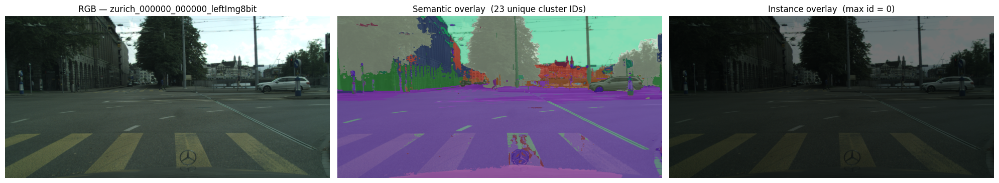

In [5]:
def load_triplet(stem: str) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    city = stem.split("_")[0]
    rgb_path = RGB_ROOT / city / f"{stem}.png"
    sem_path = PSEUDO_ROOT / f"{stem}_semantic.png"
    inst_path = PSEUDO_ROOT / f"{stem}_instance.png"
    sem = np.array(Image.open(sem_path))
    inst = np.array(Image.open(inst_path))
    rgb_img = Image.open(rgb_path).convert("RGB").resize((sem.shape[1], sem.shape[0]), Image.BILINEAR)
    return np.array(rgb_img), sem, inst

def show_triptych(stem: str, alpha: float = 0.55) -> None:
    rgb, sem, inst = load_triplet(stem)
    sem_rgb = colorize_semantic(sem)
    inst_rgb = colorize_instance(inst)
    sem_overlay = overlay(rgb, sem_rgb, alpha=alpha)
    inst_overlay = overlay(rgb, inst_rgb, alpha=alpha)
    n_inst = max(0, int(inst.max()))
    n_sem = int(len(np.unique(sem)))
    fig, ax = plt.subplots(1, 3, figsize=(20, 4))
    ax[0].imshow(rgb); ax[0].set_title(f"RGB — {stem}")
    ax[1].imshow(sem_overlay); ax[1].set_title(f"Semantic overlay  ({n_sem} unique cluster IDs)")
    ax[2].imshow(inst_overlay); ax[2].set_title(f"Instance overlay  (max id = {n_inst})")
    for a in ax: a.axis("off")
    plt.tight_layout(); plt.show()

demo_stem = frames["zurich"][0]
print("demo:", demo_stem)
show_triptych(demo_stem)

## 5. Grid: N random frames per city

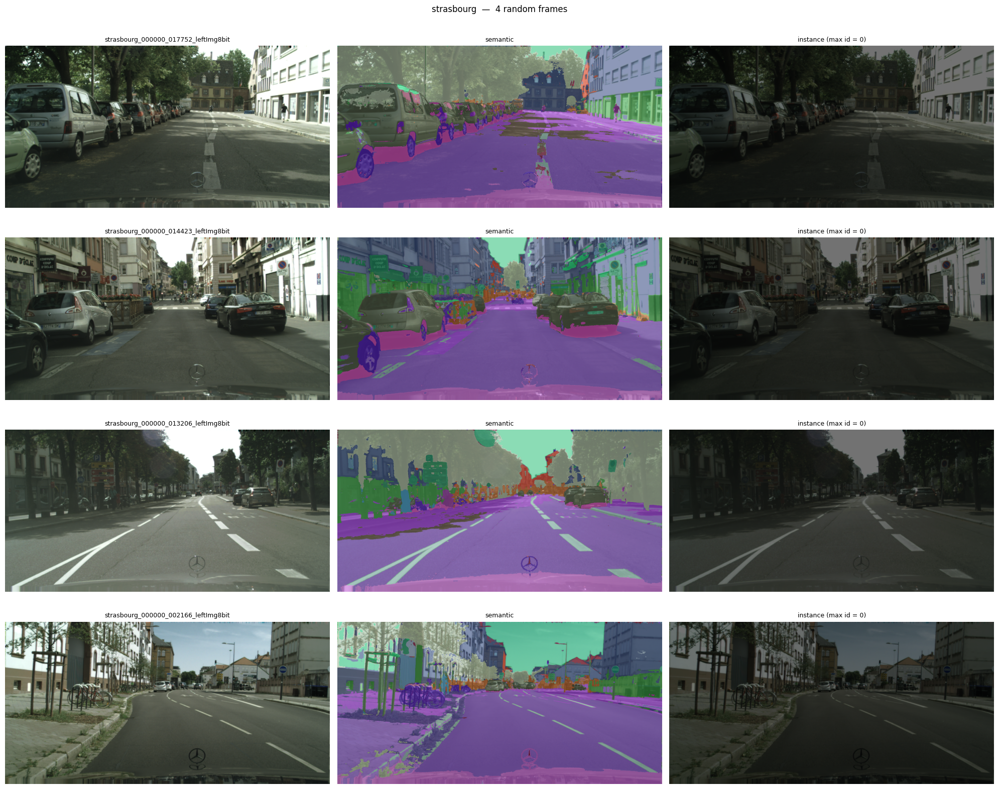

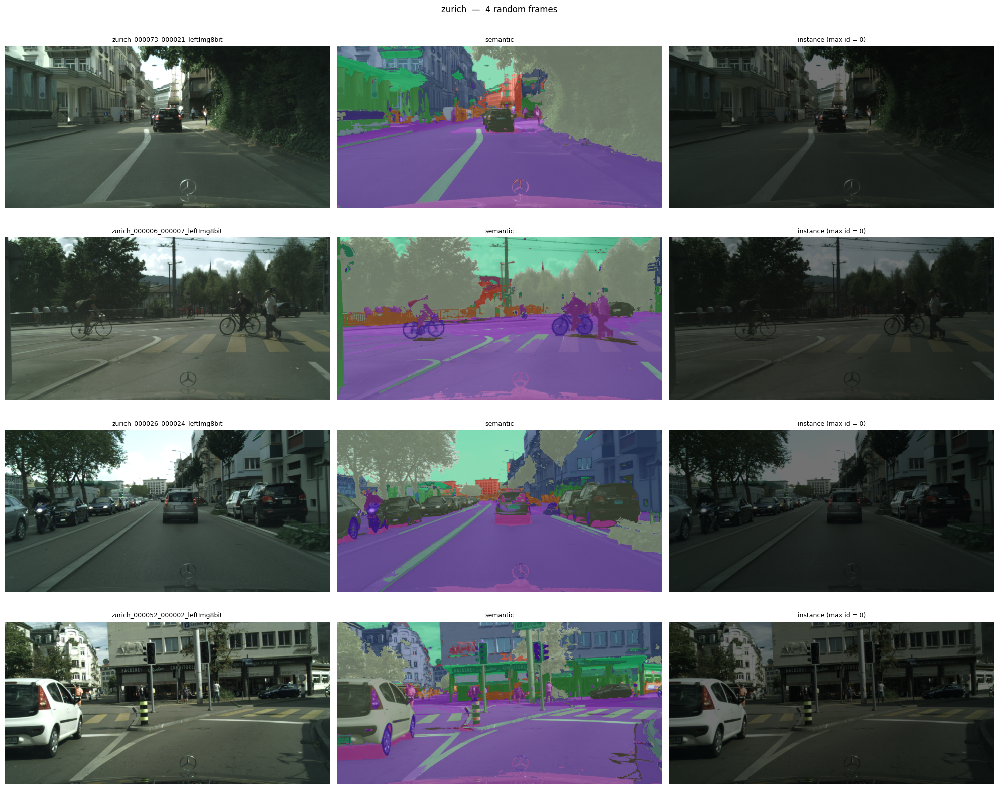

In [6]:
def show_city_grid(city: str, n: int = 4, alpha: float = 0.55) -> None:
    fs = frames[city]
    picks = random.sample(fs, k=min(n, len(fs)))
    fig, axes = plt.subplots(n, 3, figsize=(20, 4 * n))
    if n == 1:
        axes = axes[None, :]
    for row, stem in enumerate(picks):
        rgb, sem, inst = load_triplet(stem)
        sem_o = overlay(rgb, colorize_semantic(sem), alpha=alpha)
        inst_o = overlay(rgb, colorize_instance(inst), alpha=alpha)
        axes[row, 0].imshow(rgb); axes[row, 0].set_title(stem, fontsize=9)
        axes[row, 1].imshow(sem_o); axes[row, 1].set_title("semantic", fontsize=9)
        axes[row, 2].imshow(inst_o); axes[row, 2].set_title(f"instance (max id = {int(inst.max())})", fontsize=9)
        for a in axes[row]: a.axis("off")
    plt.suptitle(f"{city}  —  {n} random frames", y=1.0)
    plt.tight_layout(); plt.show()

show_city_grid("strasbourg", n=4)
show_city_grid("zurich", n=4)

## 6. `pseudo_classes_split_1.pt` — class distributions saved by CUPS

{'distribution all pixels': (27,), 'distribution inside object proposals': (27,), 'distribution per object proposal': (27,)}


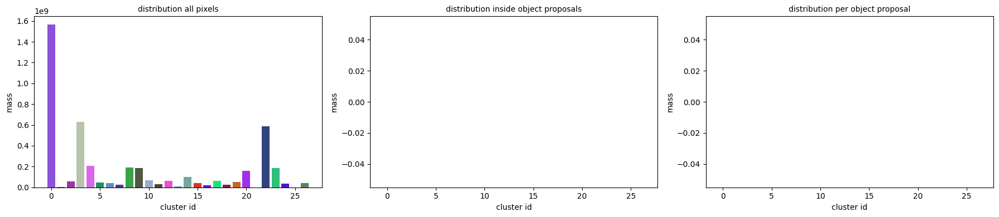

In [7]:
state = torch.load(PSEUDO_ROOT / "pseudo_classes_split_1.pt", map_location="cpu", weights_only=False)
print({k: tuple(v.shape) for k, v in state.items()})

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
for ax, (name, dist) in zip(axes, state.items()):
    vals = dist.detach().cpu().numpy()
    ax.bar(np.arange(vals.shape[0]), vals, color=SEM_PALETTE / 255.0)
    ax.set_title(name, fontsize=10)
    ax.set_xlabel("cluster id")
    ax.set_ylabel("mass")
plt.tight_layout(); plt.show()

## Notes

* **Semantic side:** Healthy. 27 over-cluster classes, ~23 unique IDs per image, distribution skewed toward stuff (road/sky/building) as expected from CUPS over-clustering on DINO features.
* **Instance side:** A 1,000-frame random sample (notebook section 2) currently returns **100 % empty instance maps**. This is the same silent SF2SE3 failure mode that the project memory file `e1_cups_pipeline_oom.md` warns about (prior santosh run hit 84.5 %). Stage-2 Cascade Mask R-CNN training will degenerate to a semantic-only model if these labels are used as-is — every thing class collapses to background.
* **Coverage:** Only `strasbourg` (2,634) and `zurich` (3,538) sequence frames landed; 16 of 18 train cities are still missing. The `_split_1` suffix on the saved state file implies a sharded run that only completed shard 1.
* **Before proceeding to Stage-2:** debug instance generation (check `gen_pseudo_labels.py` logs for `CUDA out of memory`, confirm GPU mem on the A6000 96 GB, re-run with `NUM_SUBSPLITS=1` if contention is the cause) and finish the remaining 16 cities.